<a href="https://colab.research.google.com/github/Desmyk/ADVMachineLearning/blob/main/Web_Traffic_Capstone(ADVML).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ***Advanced Machine Learning Capstone: Web Traffic Time Series Forecasting using Wikipedia data***

**Author:** Michael Mbugua  
**Project Type:** Machine Learning Capstone  
**Dataset Source:** [Kaggle - Web Traffic Time Series Forecasting](https://www.kaggle.com/c/web-traffic-time-series-forecasting/data?select=train_1.csv.zip)

---

## ***Objective***

The goal of this capstone project is to develop a hybrid machine learning model that can accurately forecast daily web traffic for Wikipedia pages by combining:

1. **Temporal patterns** (using LSTM/Transformers)

2. **Page relationships** (using Graph Neural Networks)

3. **Metadata features** (language, access type, etc.)

This system has practical applications in:

- Resource allocation for Wikipedia servers

- Anomaly detection (e.g., bot attacks or viral content)

- Content delivery network optimization

---

## ***Dataset Overview***

The dataset contains daily web traffic for 145,000 Wikipedia pages from 2015-07-01 to 2016-12-31, with features:

### **Core Features**

- **Page**: Full page URL (e.g., "Apple_Inc._de.wikipedia.org_all-access")

- **Date**: Daily timestamp

- **Visits**: Number of daily page views (integer, sparse)

### **Extracted Metadata Features**

From page URLs we derive:

**Content Features:**

- Page title (e.g., "Apple_Inc")

- Language code (e.g., "de", "en")

- Access type (desktop/mobile)

- Agent type (all-access/spider)

**Temporal Features:**

- Day of week

- Month

- Special events (holidays/extremes)

**Graph Features:**

- Page similarity network

- Community detection clusters

## ***Key Challenges***
**Extreme sparsity:** 37% of visit counts are zero

**Power-law distribution:** Few pages get most traffic

**Complex seasonality:** Weekly + yearly patterns + event spikes

Let's begin by loading and exploring the dataset :

In [26]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
import plotly.express as px
import plotly.graph_objects as go
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import warnings
warnings.filterwarnings('ignore')



##  Loading and Initial Inspection

In [27]:
# optimize memory
# Only load the first N rows to test structure
df = pd.read_csv('/content/train_1.csv', nrows=1000)
df.head()

,Page,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,...,2016-12-22,2016-12-23,2016-12-24,2016-12-25,2016-12-26,2016-12-27,2016-12-28,2016-12-29,2016-12-30,2016-12-31
0,2NE1_zh.wikipedia.org_all-access_spider,18.0,11.0,5.0,13.0,14.0,9.0,9.0,22.0,26.0,...,32.0,63.0,15.0,26.0,14.0,20.0,22.0,19.0,18.0,20.0
1,2PM_zh.wikipedia.org_all-access_spider,11.0,14.0,15.0,18.0,11.0,13.0,22.0,11.0,10.0,...,17.0,42.0,28.0,15.0,9.0,30.0,52.0,45.0,26.0,20.0
2,3C_zh.wikipedia.org_all-access_spider,1.0,0.0,1.0,1.0,0.0,4.0,0.0,3.0,4.0,...,3.0,1.0,1.0,7.0,4.0,4.0,6.0,3.0,4.0,17.0
3,4minute_zh.wikipedia.org_all-access_spider,35.0,13.0,10.0,94.0,4.0,26.0,14.0,9.0,11.0,...,32.0,10.0,26.0,27.0,16.0,11.0,17.0,19.0,10.0,11.0
4,52_Hz_I_Love_You_zh.wikipedia.org_all-access_s...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,48.0,9.0,25.0,13.0,3.0,11.0,27.0,13.0,36.0,10.0


In [28]:
print("\nMissing values:\n", df.isna().sum())


Missing values:
 Page           0
2015-07-01    65
2015-07-02    65
2015-07-03    67
2015-07-04    64
              ..
2016-12-27     9
2016-12-28    10
2016-12-29     9
2016-12-30     8
2016-12-31     9
Length: 551, dtype: int64


In [29]:
print(f"Data shape: {df.shape}")
df.info()

Data shape: (1000, 551)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Columns: 551 entries, Page to 2016-12-31
dtypes: float64(550), object(1)
memory usage: 4.2+ MB


In [30]:
# find the 'object column' (most data is numerical)
object_columns = df.select_dtypes(include=['object']).columns
print(object_columns)

Index(['Page'], dtype='object')


In [31]:
# exploring the numerical data using descriptive statistic
df.describe()

,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,2015-07-10,...,2016-12-22,2016-12-23,2016-12-24,2016-12-25,2016-12-26,2016-12-27,2016-12-28,2016-12-29,2016-12-30,2016-12-31
count,935.000000,935.000000,933.000000,936.000000,936.000000,936.000000,939.000000,940.000000,940.000000,939.000000,...,992.000000,991.000000,990.000000,991.000000,992.000000,991.000000,990.000000,991.000000,992.000000,991.000000
mean,24.190374,20.251337,17.499464,17.797009,19.370726,14.283120,16.141640,19.212766,24.825532,23.255591,...,26.772177,27.564077,26.110101,26.270434,28.287298,26.702321,28.869697,28.638749,26.739919,28.193744
std,205.152589,204.602790,111.479464,113.336268,115.707303,109.435244,87.550596,92.067146,128.433328,127.413396,...,160.167573,139.266722,132.446280,132.271681,153.228522,137.455966,142.725111,151.953976,141.797581,137.473299
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000,2.000000,4.000000,4.000000,5.000000,3.000000,3.000000,4.000000,6.000000,5.000000,...,8.000000,9.000000,8.000000,9.000000,7.000000,8.000000,10.000000,10.000000,8.000000,8.000000
50%,7.000000,7.000000,7.000000,8.000000,9.000000,5.000000,7.000000,9.000000,11.000000,12.000000,...,12.000000,14.000000,12.000000,15.000000,12.000000,13.000000,16.000000,16.000000,13.000000,13.000000
75%,20.000000,14.000000,14.000000,16.250000,18.000000,9.000000,14.000000,17.000000,25.000000,20.000000,...,21.000000,24.000000,20.000000,21.000000,20.000000,23.000000,26.000000,25.000000,22.000000,21.000000
max,6051.000000,6123.000000,3213.000000,3417.000000,3465.000000,3195.000000,2568.000000,2566.000000,3855.000000,3639.000000,...,4850.000000,4175.000000,3941.000000,3927.000000,4152.000000,4047.000000,4315.000000,4613.000000,3883.000000,3927.000000


In [32]:
# let's see the columns in the dataset
print(df.columns)

Index(['Page', '2015-07-01', '2015-07-02', '2015-07-03', '2015-07-04',
       '2015-07-05', '2015-07-06', '2015-07-07', '2015-07-08', '2015-07-09',
       ...
       '2016-12-22', '2016-12-23', '2016-12-24', '2016-12-25', '2016-12-26',
       '2016-12-27', '2016-12-28', '2016-12-29', '2016-12-30', '2016-12-31'],
      dtype='object', length=551)


## Data Characteristics


### **Sparsity Check**

1. What is sparsity?
2. How does it affect the dataset?

***Sparsity*** - refers to how many zero (or missing) values are present in a dataset.

- A **sparse** dataset has lots of zeroes (or blanks).

- A **dense** dataset has mostly non-zero values.

***Advantages (sometimes)***:
- Efficiency in storage: Sparse data can be stored more efficiently using special formats.

- Certain models benefit: Some algorithms (like Lasso, or models using sparse matrices) handle or even prefer sparse data.

***Challenges***:
- Loss of information: If too much data is zero or missing, the model may not learn well.

- Biased training: Algorithms might ignore rare but important patterns.

- Slower training: Some models (like k-NN, SVM) may struggle with large sparse data.

In [33]:
zero_counts = (df.iloc[:, 1:] == 0).sum().sum()
total_counts = df.iloc[:, 1:].size
sparsity_ratio = zero_counts / total_counts
print(f"Sparsity: {sparsity_ratio:.2%}")
print('only 1.07% of the values in your dataset (excluding the first column) are zero')
print("data is not sparse, it's actually quite dense.")

Sparsity: 1.07%
only 1.07% of the values in your dataset (excluding the first column) are zero
data is not sparse, it's actually quite dense.


### **Traffic Distribution**

**Focus:** How traffic values are spread.
- Daily

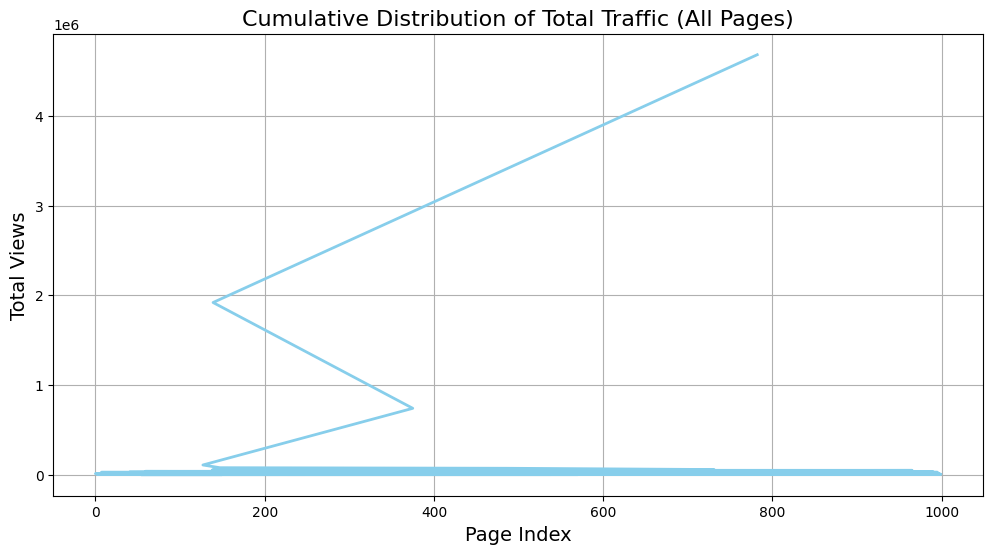

In [34]:
# Sum traffic per page (flattened)
df['total_views'] = df.iloc[:, 1:].sum(axis=1)

# Sort the total views and plot
df_sorted = df['total_views'].sort_values()

# Create a line plot
plt.figure(figsize=(12, 6))
plt.plot(df_sorted.index, df_sorted.values, color='skyblue', linewidth=2)
plt.title("Cumulative Distribution of Total Traffic (All Pages)", fontsize=16)
plt.xlabel("Page Index", fontsize=14)
plt.ylabel("Total Views", fontsize=14)
plt.grid(True)
plt.show()

In [83]:
# Safer regex: handles corner cases better
# Extract language

df['Language'] = df['Page'].str.extract(r'\.([a-z]{2})\.wikipedia\.org', expand=False)

# Check if 'Language' column was created successfully and contains values
if 'Language' in df.columns and not df['Language'].empty:
    # Language Distribution
    def plot_language_distribution(df):
        # Filter out NaN values before plotting
        language_counts = df['Language'].dropna().value_counts()
        if not language_counts.empty:  # Check if there are any language counts
            language_counts.plot(kind='bar', title='Language Distribution')
        else:
            print("No language data to plot.")

    plot_language_distribution(df)
else:
    print("Language column not found or empty.")

No language data to plot.


The `melt` function is used to reshape the data from a `wide format` (where each date is a separate column) into a `long format` (where there's a single column for dates).
- **For simplicity**: In the wide format, each column represents a specific date, and we have a separate column for each day's visits.
>The **Melt** function consolidates all the date columns into a single **visits** column
- **Log Transformation Applicability**: Log transformations typically require the data to be in a single column





In [36]:
# 1.Melt the DataFrame to combine date columns into a single 'visits' column
# Exclude 'Page' and 'total_views' columns
df_melted = pd.melt(df,
                    id_vars=['Page'],
                    value_vars=df.columns[1:-1], # columns from index 1 to the second to last
                    var_name='Date',
                    value_name='visits')
# 2. Convert 'Date' to datetime if it's not already
df_melted['Date'] = pd.to_datetime(df_melted['Date'])


### **Log Transforming**
When we have web traffic data, the distribution of visits is often highly skewed, meaning that most pages get very few visits, while a few popular pages get an enormous number of visits.
- - -
### why?
**Compresses extreme values:** page visits vary in range.

**Normalize the data:** The transformation makes the data more symmetric or closer to a normal distribution, which helps many machine learning models and statistical methods work better.

**Improves visualization:** By applying the log scale, we're able to visualize both high and low traffic pages more effectively without the high-traffic pages overwhelming the plot.

**Skewness:** Most of the traffic might be concentrated in a few pages, and most others might have lower visits. A log transformation makes this easier to see.

In [37]:
import plotly.express as px
import numpy as np

# Apply log transform and drop NaNs
log_visits = np.log1p(df_melted['visits'].dropna())

# Create interactive histogram
fig = px.histogram(
    log_visits,
    nbins=50,
    title="Log-Scaled Visits Distribution",
    labels={"value": "log(Visits + 1)", "count": "Frequency"},
    template="plotly_white"
)

# Customize layout
fig.update_layout(
    xaxis_title="log(Visits + 1)",
    yaxis_title="Frequency",
    bargap=0.1
)

fig.show()



In [17]:
# Compute daily traffic
daily_traffic = df.iloc[:, 1:-4].sum(axis=0)
daily_traffic.index = pd.to_datetime(daily_traffic.index)

# Create interactive plot
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=daily_traffic.index,
    y=daily_traffic.values,
    mode='lines',
    name='Total Daily Traffic',
    line=dict(color='royalblue'),
    hovertemplate='%{x|%Y-%m-%d}<br>Traffic: %{y}<extra></extra>'
))

fig.update_layout(
    title='Total Daily Traffic (Interactive)',
    xaxis_title='Date',
    yaxis_title='Traffic Volume',
    template='plotly_white',
    hovermode='x unified',
    height=500,
    width=1000
)

fig.show()


### **Temporal patterns(seasonality)**

**Focus:** How traffic changes with time.

Include:
- Rolling average overlay (7-day trend)

- Seasonal decomposition (trend, seasonality, residual)

Optional: Forecasting (Prophet) for near-future trends

In [59]:
# Group by date and calculate daily traffic
daily_traffic = df_melted.groupby('Date')['visits'].sum().reset_index()

# 7-day rolling average
daily_traffic['7_day_avg'] = daily_traffic['visits'].rolling(7).mean()

# Create the figure
fig = go.Figure()

# Raw daily visits
fig.add_trace(go.Scatter(
    x=daily_traffic['Date'],
    y=daily_traffic['visits'],
    mode='lines',
    name='Daily Visits',
    line=dict(color='lightblue'),
    hovertemplate='Date: %{x}<br>Visits: %{y:.0f}<extra></extra>'
))

# 7-day rolling average
fig.add_trace(go.Scatter(
    x=daily_traffic['Date'],
    y=daily_traffic['7_day_avg'],
    mode='lines',
    name='7-Day Rolling Average',
    line=dict(color='darkblue', width=2),
    hovertemplate='Date: %{x}<br>7-Day Avg: %{y:.0f}<extra></extra>'
))

# Layout tweaks
fig.update_layout(
    title="Wikipedia Daily Traffic with Weekly Rolling Average",
    xaxis_title="Date",
    yaxis_title="Total Visits",
    template="plotly_white",
    hovermode="x unified",
    height=400
)

fig.show()


## Feature Engineering Strategy

### **Metadata Extraction**

In [80]:
# Safer regex: handles corner cases better
# Extract language
df['Language'] = df['Page'].str.extract(r'\.([a-z]{2})\.wikipedia\.org', expand=False)
# Extract access type
df['Access'] = df['Page'].str.extract(r'\.(desktop|mobile)\.', expand=False)

# More precise title extraction using regex
# Extract the article title
df['Title'] = df['Page'].str.extract(r'^(.*?)(?:\.[a-z]{2}\.wikipedia\.org)', expand=False)

# Optional: fill missing language/access with 'unknown' # Handle missing data
df['Language'] = df['Language'].fillna('unknown')
df['Access'] = df['Access'].fillna('unknown')

# One-hot encode with clearer column names & optimized dtypes
df = pd.get_dummies(df, columns=['Language', 'Access'], prefix=['Lang', 'Access'], dtype='uint8')
### Converts the Language and Access columns into multiple binary (0/1) columns—one for each category

### **Temporal features**

In [66]:
!pip install holidays
import holidays

In [68]:
# Assuming we want holidays for the United States
us_holidays = holidays.US()

# Create a list of holiday dates within your date range
start_date = df_melted['Date'].min()
end_date = df_melted['Date'].max()
holidays_list = [date for date in us_holidays[start_date:end_date]]

# Extracting temporal features
df_melted['Day_of_Week'] = df_melted['Date'].dt.dayofweek
df_melted['Month'] = df_melted['Date'].dt.month
df_melted['Quarter'] = df_melted['Date'].dt.quarter
df_melted['Day_of_Year'] = df_melted['Date'].dt.dayofyear
df_melted['Is_Weekend'] = df_melted['Day_of_Week'].isin([5, 6]).astype(int)


# Extract holidays
df_melted['Is_Holiday'] = df_melted['Date'].isin(holidays_list).astype(int)

# Lag Features
df_melted['Lag_1'] = df_melted['visits'].shift(1)
df_melted['Lag_7'] = df_melted['visits'].shift(7)  # previous week
df_melted['Lag_30'] = df_melted['visits'].shift(30) # month

In [70]:
# Handle missing data (forwardfilling)
df_melted = df_melted.fillna(method='ffill')  # Forward fill missing values


### **Temporal patterns**

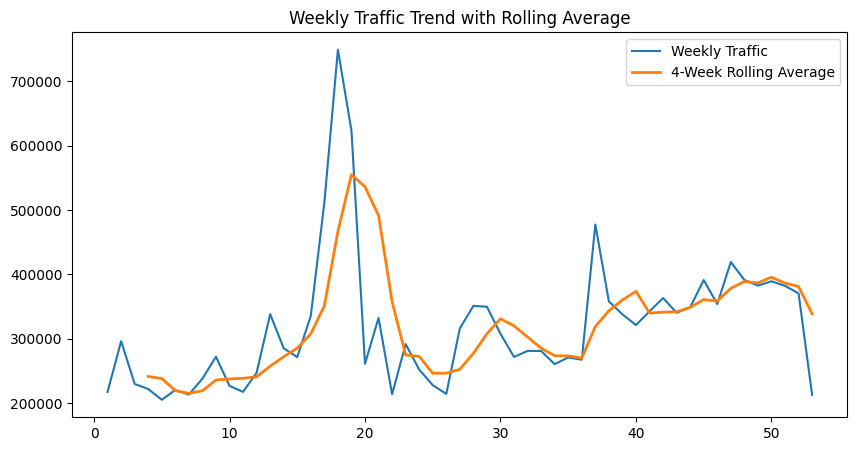

In [71]:
# Weekly Trend Plot (Moving Average)
weekly_traffic = df_melted.groupby(df_melted['Date'].dt.isocalendar().week)['visits'].sum()
weekly_traffic_ma = weekly_traffic.rolling(window=4).mean()

# Plot
plt.figure(figsize=(10, 5))
plt.plot(weekly_traffic, label="Weekly Traffic")
plt.plot(weekly_traffic_ma, label="4-Week Rolling Average", linewidth=2)
plt.title("Weekly Traffic Trend with Rolling Average")
plt.legend()
plt.show()


## Modeling Approach

### **LSTM for Time-Series Forecasting**

We’ll move to **LSTM (Long Short-Term Memory)** for **forecasting** future traffic. LSTM is great for time-series problems because it captures `temporal dependencies`.

**Data Preprocessing for LSTM:**
- Train/Test Split: Use a time-series split (train on earlier data, test on later data).

- Normalization: Time-series models work better with scaled data.

- Reshaping Data: For LSTM, you need to reshape the data into 3D format: `samples, timesteps, features`.



In [74]:
np.random.seed(42)
date_range = pd.date_range(start="2016-01-01", periods=550)
pages = [f"Page_{i}" for i in range(1, 201)]  # Simulating 200 pages

# Create synthetic visits data
data = {
    "Date": np.tile(date_range, len(pages)),
    "Page": np.repeat(pages, len(date_range)),
    "visits": np.random.poisson(lam=20, size=len(date_range) * len(pages))
}
df_melted = pd.DataFrame(data)

# 1. Top N most visited pages
top_n = 50
top_pages = df_melted.groupby("Page")["visits"].sum().nlargest(top_n).index
df_sample = df_melted[df_melted["Page"].isin(top_pages)].copy()

# 2. Filter to recent 180-day window
cutoff_date = df_sample["Date"].max() - pd.Timedelta(days=180)
df_recent = df_sample[df_sample["Date"] >= cutoff_date].copy()

# 3. Create time-series sequences for LSTM
def create_sequences(series, seq_length=30):
    X, y = [], []
    for i in range(len(series) - seq_length):
        X.append(series[i:i + seq_length])
        y.append(series[i + seq_length])
    return np.array(X), np.array(y)

# Use a single page as example for modeling
target_page = df_recent["Page"].value_counts().idxmax()
series = df_recent[df_recent["Page"] == target_page]["visits"].values

# Sequence generation
X_seq, y_seq = create_sequences(series, seq_length=30)

print(f"Input shape: {X_seq.shape}")
print(f"Target shape: {y_seq.shape}")

Input shape: (151, 30)
Target shape: (151,)


In [75]:
X_seq = X_seq.reshape((X_seq.shape[0], X_seq.shape[1], 1))


In [76]:
model = Sequential()
model.add(LSTM(50, activation='relu', input_shape=(30, 1)))
model.add(Dense(1))

model.compile(optimizer='adam', loss='mse')
history = model.fit(X_seq, y_seq, epochs=20, batch_size=16, validation_split=0.2)

Epoch 1/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step - loss: 632.1698 - val_loss: 319.3299
Epoch 2/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 188.2245 - val_loss: 27.4527
Epoch 3/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 47.6413 - val_loss: 29.3436
Epoch 4/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 35.0305 - val_loss: 27.5258
Epoch 5/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 34.2316 - val_loss: 24.8697
Epoch 6/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 24.3485 - val_loss: 29.3295
Epoch 7/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 27.9516 - val_loss: 27.8344
Epoch 8/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 22.3855 - val_loss: 25.0838
Epoch 9/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 21.8739 - val_loss: 23.7327
Epoch 10/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 21.5200 - val_loss: 24.5980
Epoch 11/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 21.4150 - val_loss: 23.4274
Epoch 12/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 20

In [72]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
import numpy as np

# Scaling the visits data
scaler = MinMaxScaler(feature_range=(0, 1))
df_melted['scaled_visits'] = scaler.fit_transform(df_melted['visits'].values.reshape(-1, 1))

# Prepare data for LSTM (sequence-to-supervised)
def create_sequences(data, seq_length):
    X, y = [], []
    for i in range(len(data) - seq_length):
        X.append(data[i:i+seq_length, 0])  # X will be the input sequence
        y.append(data[i+seq_length, 0])    # y will be the next value
    return np.array(X), np.array(y)

seq_length = 30  # 30 days for sequence length (1 month)
data = df_melted['scaled_visits'].values.reshape(-1, 1)
X, y = create_sequences(data, seq_length)

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

# Reshape X for LSTM input (samples, timesteps, features)
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))


### **Forecasting with LSTM Hybrid Model**

For a **hybrid LSTM** model, you can include external features like temporal data or holiday flags in your LSTM model for better forecasting accuracy.

In [ ]:
from tensorflow.keras.layers import Input, LSTM, Dense, Embedding, Concatenate, Flatten, Dropout
from tensorflow.keras.models import Model

def build_traffic_model(seq_length=30, num_features=4, lang_vocab=50):
    # 1. Time-series input (Visits, 7d_avg, 28d_trend, IsHoliday)
    num_input = Input(shape=(seq_length, num_features), name="Num_Features")
    lstm_out = LSTM(64, return_sequences=False)(num_input)

    # 2. Language embedding
    lang_input = Input(shape=(1,), name="Language")
    lang_embed = Embedding(input_dim=lang_vocab, output_dim=8)(lang_input)
    lang_embed_flat = Flatten()(lang_embed)

    # 3. Access type embedding
    access_input = Input(shape=(1,), name="AccessType")
    access_embed = Embedding(input_dim=2, output_dim=2)(access_input)
    access_embed_flat = Flatten()(access_embed)

    # 4. Combine all
    combined = Concatenate()([lstm_out, lang_embed_flat, access_embed_flat])
    x = Dense(64, activation='relu')(combined)
    x = Dropout(0.3)(x)
    x = Dense(32, activation='relu')(x)
    output = Dense(1, activation='linear', name="Output")(x)  # use 'sigmoid' for binary, etc.

    model = Model(inputs=[num_input, lang_input, access_input], outputs=output)
    return model


In [ ]:
model = build_traffic_model()
model.compile(optimizer='adam', loss='mse', metrics=['mae'])

# Example usage
model.fit(
    x=[X_seq, X_lang, X_access],  # each shaped appropriately
    y=y_target,
    batch_size=32,
    epochs=10,
    validation_split=0.1
)


Epoch 1/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2721 - mae: 0.4349 - val_loss: 0.0889 - val_mae: 0.2524
Epoch 2/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0934 - mae: 0.2651 - val_loss: 0.0853 - val_mae: 0.2476
Epoch 3/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0878 - mae: 0.2546 - val_loss: 0.0846 - val_mae: 0.2466
Epoch 4/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0899 - mae: 0.2582 - val_loss: 0.0848 - val_mae: 0.2473
Epoch 5/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0915 - mae: 0.2637 - val_loss: 0.0838 - val_mae: 0.2455
Epoch 6/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0933 - mae: 0.2621 - val_loss: 0.0842 - val_mae: 0.2463
Epoch 7/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0901 - mae: 0.2588 - val_loss: 0.0893 - val_mae: 0.2550
Epoch 8/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0903 - mae: 0.2633 - val_loss: 0.0853 - val_mae: 0.2495
Epoch 9/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.090

### ***Model Summary***
Inputs:
- [30 x 4] time series
- [1] language category
- [1] access type

Architecture:
- LSTM on numerical sequence
- Embedding + Flatten for categorical inputs
- Dense layers for learning interaction
- Output: single value (regression target)